## Import modules

In [200]:
from pathlib import Path

import requests
import zipfile
import io

import pandas as pd
import numpy as np

import joblib

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.neighbors import BallTree
from sklearn.metrics import silhouette_score

from kneed import KneeLocator

from utils import (unpack_datetime, UnpackWhat)

# Earth's radius / kilometers in one radian
EARTH_RADIUS_KM = 6371.0

## Recupération des data

In [201]:
# URL of the ZIP file
JEDHA_DATASET_URL = "https://full-stack-bigdata-datasets.s3.eu-west-3.amazonaws.com/Machine+Learning+non+Supervis%C3%A9/Projects/uber-trip-data.zip"

# base DATA folder
DATA_BASE_DIR = Path.joinpath(Path.cwd(), 'data')
DATA_BASE_DIR.mkdir(exist_ok=True)

# raw data folder
RAW_DATA_DIR = DATA_BASE_DIR / "raw"
RAW_DATA_DIR.mkdir(exist_ok=True)

# if nothing in raw folder, download and unzip JEDHA dataset archive
if not any(RAW_DATA_DIR.iterdir()):
    print("RAW data folder is empty. Downloading and extracting data...")

    response = requests.get(JEDHA_DATASET_URL)
    response.raise_for_status()  # Ensure the request was successful

    # print("Unzipping the contents...")
    # with zipfile.ZipFile(io.BytesIO(response.content)) as zip_ref:
    #     zip_ref.extractall(DATA_BASE_DIR)


    # Just extract the content of 'uber-trip-data/' folder
    print("Extracting 'uber-trip-data/' contents...")
    with zipfile.ZipFile(io.BytesIO(response.content)) as zip_ref:
        for member in zip_ref.namelist():
            if member.startswith("uber-trip-data/") and not member.endswith("/"):
                # Extract into our destination directory (removing the top folder name)
                relative_path = Path(member).relative_to("uber-trip-data")
                target_path = RAW_DATA_DIR / relative_path
                target_path.parent.mkdir(parents=True, exist_ok=True)
                with zip_ref.open(member) as source, open(target_path, "wb") as target:
                    target.write(source.read())

    print(f"Extraction completed. Files are in: {RAW_DATA_DIR.resolve()}")
else:
    print(f"RAW data folder is not empty. Skipping download. Contents already exist in: {RAW_DATA_DIR.resolve()}")
    
# Lister les fichiers extraits
print("\nListe des fichiers disponibles :")
for path in RAW_DATA_DIR.rglob("*"):
    if path.is_file():
        print(f"- {path.relative_to(RAW_DATA_DIR)}")

RAW data folder is not empty. Skipping download. Contents already exist in: /workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw

Liste des fichiers disponibles :
- taxi-zone-lookup.csv
- uber-raw-data-apr14.csv
- uber-raw-data-aug14.csv
- uber-raw-data-janjune-15.csv.zip
- uber-raw-data-jul14.csv
- uber-raw-data-jun14.csv
- uber-raw-data-may14.csv
- uber-raw-data-sep14.csv


### Description

*Courses Uber*

Il y a deux années representées:
- 2014: 6 fichiers`uber-raw-data-(apr14|may14|jun14|jul14|au14|sep14)` (données d'avril à septembre 2014):

Header | Definition
---|---------
`Date/Time` | The date and time of the Uber pickup
`Lat` | The latitude of the Uber pickup
`Lon` | The longitude of the Uber pickup
`Base` | The [TLC base company](http://www.nyc.gov/html/tlc/html/industry/base_and_business.shtml) code affiliated with the Uber pickup

- 2025: 1 archive `uber-raw-data-janjune-15.csv.zip` avec les données des mois de janvier à juin 2015 mais un format de colonnes différent:

Header | Definition
---|---------
`Dispatching_base_num` | The [TLC base company](http://www.nyc.gov/html/tlc/html/industry/base_and_business.shtml) code of the base that dispatched the Uber
`Pickup_date` | The date and time of the Uber pickup
`Affiliated_base_num` | The [TLC base company](http://www.nyc.gov/html/tlc/html/industry/base_and_business.shtml) code affiliated with the Uber pickup
`locationID` | The pickup location ID affiliated with the Uber pickup

Le fichier `taxi-zone-lookup.csv` donne les `Zone` and `Borough` des taxis pour chaque `locationID`
***Colonnes***: `LocationID`, `Borough`, `Zone`

⚠️Les données de 2015 sont un peu plus difficiles à exploiter vu qu'elle ne fournissent pas directement la localisation GPS.

## Chargement des données

In [202]:
raw_data_files_2014 = [file for file in RAW_DATA_DIR.glob('uber-raw-data*.csv')]
raw_data_files_2014.sort()

print("Nb of files: ", len(raw_data_files_2014))
print(raw_data_files_2014)

Nb of files:  6
[PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-apr14.csv'), PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-aug14.csv'), PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-jul14.csv'), PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-jun14.csv'), PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-may14.csv'), PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-sep14.csv')]


In [203]:
raw_data_files_2014[0:7]

[PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-apr14.csv'),
 PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-aug14.csv'),
 PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-jul14.csv'),
 PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-jun14.csv'),
 PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-may14.csv'),
 PosixPath('/workspaces/jedha-cdsd-cert-projects/bloc-3/Uber Pickups/data/raw/uber-raw-data-sep14.csv')]

In [204]:
# Load N file (1 to 6)
NB_FILES_TO_LOAD = 6

raw_data_df = pd.concat(map(pd.read_csv, raw_data_files_2014[0:NB_FILES_TO_LOAD]))

# raw_data_df = pd.read_csv(raw_data_files_2014[0])
raw_data_df.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [205]:
raw_data_df.shape

(4534327, 4)

In [206]:
raw_data_df.isna().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

In [207]:
# normalize column names
raw_data_df.columns = ['date_time', 'lat', 'lon', 'base']

# Convert datetime
raw_data_df['date_time'] = pd.to_datetime(raw_data_df['date_time'])

# Unpack datetime
unpack_datetime(raw_data_df, 'date_time', UnpackWhat.ALL, prefix='dt', inplace=True)

# Preview
display(raw_data_df)

,date_time,lat,lon,base,dt_date,dt_year,dt_month,dt_week,dt_day,dt_day_name,dt_weekday,dt_hour,dt_minute,dt_second
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,2014-04-01,2014,4,14,1,Tuesday,1,0,11,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,2014-04-01,2014,4,14,1,Tuesday,1,0,17,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,2014-04-01,2014,4,14,1,Tuesday,1,0,21,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,2014-04-01,2014,4,14,1,Tuesday,1,0,28,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,2014-04-01,2014,4,14,1,Tuesday,1,0,33,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1028131,2014-09-30 22:57:00,40.7668,-73.9845,B02764,2014-09-30,2014,9,40,30,Tuesday,1,22,57,0
1028132,2014-09-30 22:57:00,40.6911,-74.1773,B02764,2014-09-30,2014,9,40,30,Tuesday,1,22,57,0
1028133,2014-09-30 22:58:00,40.8519,-73.9319,B02764,2014-09-30,2014,9,40,30,Tuesday,1,22,58,0
1028134,2014-09-30 22:58:00,40.7081,-74.0066,B02764,2014-09-30,2014,9,40,30,Tuesday,1,22,58,0


In [208]:
raw_data_df.describe(include = 'all')

,date_time,lat,lon,base,dt_date,dt_year,dt_month,dt_week,dt_day,dt_day_name,dt_weekday,dt_hour,dt_minute,dt_second
count,4534327,4.534327e+06,4.534327e+06,4534327,4534327,4534327.0,4.534327e+06,4534327.0,4.534327e+06,4534327,4.534327e+06,4.534327e+06,4.534327e+06,4534327.0
unique,NaN,NaN,NaN,5,183,NaN,NaN,<NA>,NaN,7,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,B02617,2014-09-13,NaN,NaN,<NA>,NaN,Thursday,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,1458853,43205,NaN,NaN,<NA>,NaN,755145,NaN,NaN,NaN,NaN
mean,2014-07-11 18:50:50.578151424,4.073926e+01,-7.397302e+01,NaN,NaN,2014.0,6.828703e+00,28.172049,1.594337e+01,NaN,2.968115e+00,1.421831e+01,2.940071e+01,0.0
min,2014-04-01 00:00:00,3.965690e+01,-7.492900e+01,NaN,NaN,2014.0,4.000000e+00,14.0,1.000000e+00,NaN,0.000000e+00,0.000000e+00,0.000000e+00,0.0
25%,2014-05-28 15:18:00,4.072110e+01,-7.399650e+01,NaN,NaN,2014.0,5.000000e+00,22.0,9.000000e+00,NaN,1.000000e+00,1.000000e+01,1.400000e+01,0.0
50%,2014-07-17 14:45:00,4.074220e+01,-7.398340e+01,NaN,NaN,2014.0,7.000000e+00,29.0,1.600000e+01,NaN,3.000000e+00,1.500000e+01,2.900000e+01,0.0
75%,2014-08-27 21:55:00,4.076100e+01,-7.396530e+01,NaN,NaN,2014.0,8.000000e+00,35.0,2.300000e+01,NaN,5.000000e+00,1.900000e+01,4.400000e+01,0.0
max,2014-09-30 22:59:00,4.211660e+01,-7.206660e+01,NaN,NaN,2014.0,9.000000e+00,40.0,3.100000e+01,NaN,6.000000e+00,2.300000e+01,5.900000e+01,0.0


Text(0.5, 1.0, 'Longitude')

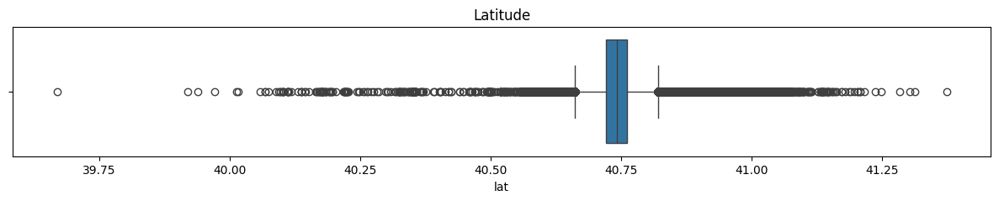

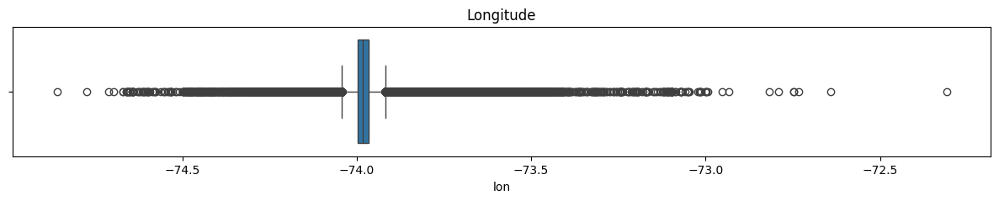

In [209]:
sample_raw_data_df = raw_data_df.sample(500000)
fig, ax = plt.subplots(figsize=(15, 2))

sns.boxplot(sample_raw_data_df, x="lat")
ax.set_title("Latitude")
  
fig, ax = plt.subplots(figsize=(15, 2))

sns.boxplot(sample_raw_data_df, x="lon")
ax.set_title("Longitude")

In [210]:
# Pour réduire/recentrer les datas on va appliquer un filtrage des outliers aux colonnes latitude et longitude

print("Initial shape: ", raw_data_df.shape)

for col in ["lat", "lon"] :
    col_mean = raw_data_df[col].mean()
    col_std = raw_data_df[col].std()
    range_min = col_mean - 3 * col_std
    range_max = col_mean + 3 * col_std
  
    raw_data_df = raw_data_df[(raw_data_df[col] > range_min) & (raw_data_df[col] <= range_max)]
    
print("New Shape: ", raw_data_df.shape)

Initial shape:  (4534327, 14)
New Shape:  (4301626, 14)


## Exploration / Visualisation

On va tenter de comprendre les différents pattern

- courses par mois
- courses par jour de la semaine
- courses par heure
- courses par heure des jour par semaine

### Rides distributions

#### Monthly

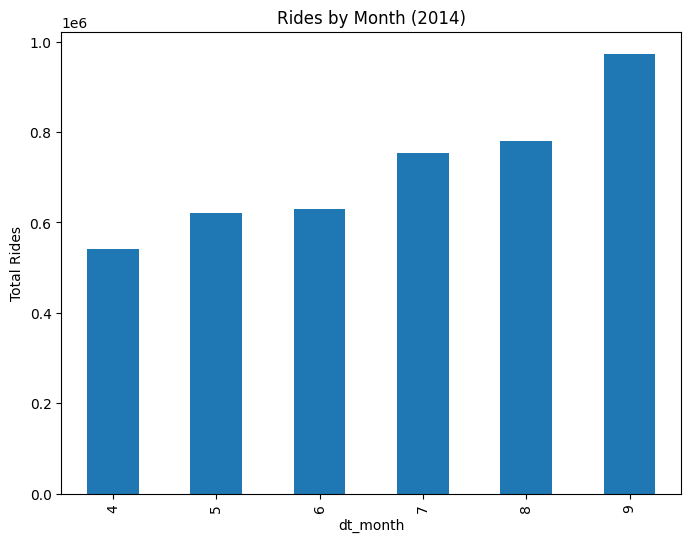

In [211]:
month_df = raw_data_df.pivot_table(index=["dt_month"],
                                  values="base",
                                  aggfunc="count")
month_df.plot(kind="bar", figsize=(8,6), legend=False)
plt.ylabel("Total Rides")
plt.title("Rides by Month (2014)")
plt.show()

#### Week days

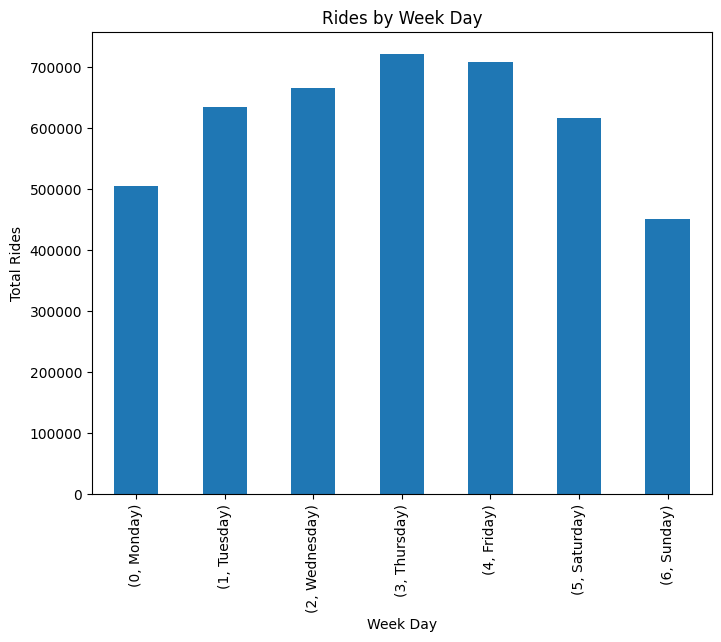

In [212]:
weekdays_df = raw_data_df.pivot_table(index=["dt_weekday", "dt_day_name"],
                                  values="base",
                                  aggfunc="count")
weekdays_df.plot(kind="bar", figsize=(8,6), legend=False)
plt.ylabel("Total Rides")
plt.xlabel("Week Day")
plt.title("Rides by Week Day")
plt.show()

#### Hourly

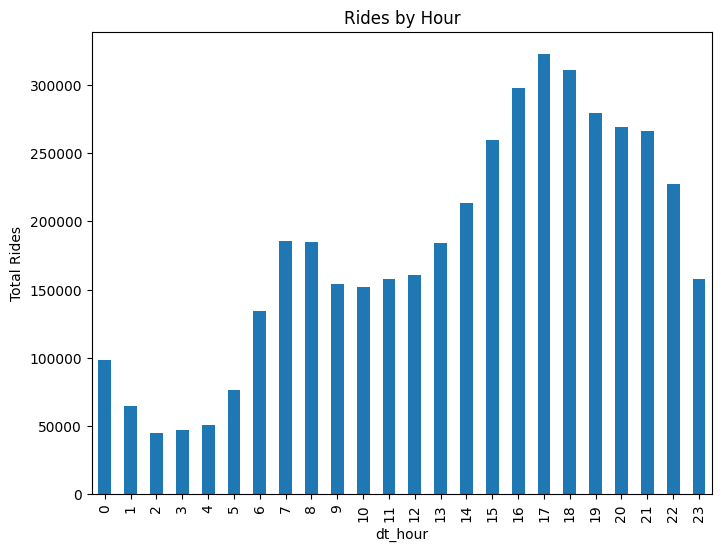

In [213]:
hour_df = raw_data_df.pivot_table(index=["dt_hour"],
                                  values="base",
                                  aggfunc="count")
hour_df.plot(kind="bar", figsize=(8,6), legend=False)
plt.ylabel("Total Rides")
plt.title("Rides by Hour")
plt.show()

#### Hourly per days of week

In [214]:
hour_df = raw_data_df.pivot_table(index=["dt_weekday", "dt_day_name", "dt_hour"],
                                  values="base",
                                  aggfunc="count").reset_index()

fig = px.line(hour_df,
              x="dt_hour", y="base", color="dt_day_name",
              title="Rides per hour on days of week",
              labels={
                  "dt_hour": "Hour",
                  "dt_weekday": "Day of Week",
                  "base": "Total Rides"
              },
              width=800, height=400,)

fig.update_layout(
    legend_title_text="Day of Week",
)
fig.show()

### One day rides, per hour, density map

In [215]:
# Let vizualize hourly trips density on one day! We will pick a Thursday on September
# Let pick first thursday of September
month = 9 # September
weekday = 3 # Thursday
day = raw_data_df[(raw_data_df["dt_month"] == month) & (raw_data_df["dt_weekday"] == weekday)]["dt_day"].unique()[0]

# Keep day rides
df  = raw_data_df[(raw_data_df["dt_month"] == month) & (raw_data_df["dt_day"] == day)]

# Nombre de courses par heure
hourly_counts = df['dt_hour'].value_counts().sort_index()
line_chart = go.Scatter(
    x=hourly_counts.index,
    y=hourly_counts.values,
    mode='lines+markers',
    name='Nombre de courses',
    line=dict(color='blue')
)

# Base map settings
mapbox_style = "open-street-map" #"carto-positron"
mapbox_center = {"lat": df["lat"].mean(), "lon": df["lon"].mean()}

# Créer les frames pour chaque heure
frames = []
for hour in sorted(df["dt_hour"].unique()):
    hourly_df = df[df["dt_hour"] == hour]
    fig_hour = px.density_map(
        hourly_df,
        lat="lat",
        lon="lon",
        z=None,
        radius=5,
        center=mapbox_center,
        zoom=11,
        map_style=mapbox_style,
    )
    
    # Ligne verticale animée (sous forme de "shape")
    shape = {
        "type": "line",
        "xref": "x",
        "yref": "y",
        "x0": hour,
        "x1": hour,
        "y0": 0,
        "y1": hourly_counts.max(),
        "line": {"color": "red", "width": 2, "dash": "dash"}
    }

    frames.append(go.Frame(
        data=fig_hour.data,
        name=str(hour),
        layout={"shapes": [shape]}
    ))

# Figure principale
fig = go.Figure(
    data=px.density_map(
        df[df["dt_hour"] == 0],
        lat="lat",
        lon="lon",
        radius=5,
        center=mapbox_center,
        zoom=11,
        map_style=mapbox_style
    ).data,
    layout=go.Layout(
        title=f"Densité des courses par heure le {day}/{month:02d}/{df['dt_year'].unique()[0]}",
        map=dict(
            style=mapbox_style,
            center=mapbox_center,
            zoom=11
        ),
        updatemenus=[{
            "buttons": [
                {
                    "args": [None, {"frame": {"duration": 500, "redraw": True}, "fromcurrent": True}],
                    "label": "Play",
                    "method": "animate"
                },
                {
                    "args": [[None], {"frame": {"duration": 0}, "mode": "immediate", "transition": {"duration": 0}}],
                    "label": "Pause",
                    "method": "animate"
                }
            ],
            "direction": "left",
            "pad": {"r": 10, "t": 87},
            "showactive": False,
            "type": "buttons",
            "x": 0.1,
            "xanchor": "right",
            "y": 0,
            "yanchor": "top"
        }],
        sliders=[{
            "active": 0,
            "pad": {"t": 50},
            "steps": [{
                "args": [[str(hour)], {"frame": {"duration": 300, "redraw": True},
                                       "mode": "immediate"}],
                "label": f"{hour}h",
                "method": "animate"
            } for hour in sorted(df['dt_hour'].unique())]
        }]
    ),
    frames=frames
)

# Ajouter la courbe en dessous dans un subplot
from plotly.subplots import make_subplots

final_fig = make_subplots(
    rows=2, cols=1,
    shared_xaxes=False,
    row_heights=[0.8, 0.2],
    vertical_spacing=0.05,
    specs=[[{"type": "map"}], [{"type": "xy"}]]
)

# Ajouter la trace map (initiale)
for trace in fig.data:
    final_fig.add_trace(trace, row=1, col=1)

# Ajouter la courbe
final_fig.add_trace(line_chart, row=2, col=1)

fig.update_layout(
    shapes=[  # ligne initiale
        dict(
            type="line",
            x0=0,
            x1=0,
            y0=0,
            y1=hourly_counts.max(),
            line=dict(color="red", width=2, dash="dash"),
            xref="x",
            yref="y"
        )
    ]
)

# Appliquer le reste des propriétés
final_fig.update_layout(fig.layout)
final_fig.frames = fig.frames

final_fig.update_layout(height=1000, width=1000)

final_fig.show()


## Clustering

### Exploration sur un jeu de données restreint

#### Préparation du dataset de test

In [216]:
# Let analyze 18h on first thursday of September
month = 9 # September
weekday = 3 # Thursday
hour = 18
day = raw_data_df[(raw_data_df["dt_month"] == month) & (raw_data_df["dt_weekday"] == weekday)]["dt_day"].unique()[0]

assess_hour_df = raw_data_df[(raw_data_df["dt_month"] == month) & (raw_data_df["dt_weekday"] == weekday) & (raw_data_df["dt_hour"] == hour)]["dt_day"].unique()[0]

# Keep hourly rides
assess_hour_df  = raw_data_df[(raw_data_df["dt_month"] == month) & (raw_data_df["dt_day"] == day) & (raw_data_df["dt_hour"] == hour)]

assess_hour_df.shape

(2949, 14)

In [238]:
# Base map settings
mapbox_style = "open-street-map" #"carto-positron"
mapbox_center = {"lat": assess_hour_df["lat"].mean(), "lon": assess_hour_df["lon"].mean()}
    
fig_hour = px.density_map(
    assess_hour_df,
    lat="lat",
    lon="lon",
    z=None,
    radius=5,
    center=mapbox_center,
    zoom=11,
    map_style=mapbox_style,
    title= f"Uber rides du {day}/{month:02d}/{assess_hour_df['dt_year'].unique()[0]} @ {hour}h"
)

fig_hour.update_layout(
    margin=dict(l=10, r=10, t=50, b=10),
)

fig_hour.update_layout(height=1000, width=1000)

fig_hour.show()


<span style="color:orange">Snapshot `Uber rides du 4/09/2014 @ 18h` pour github:</span>

![uber_rides-01.png](./assets/uber_rides-01.png)

#### K-Means

In [218]:
# Prepare dataset
# 1. select features
kmeans_df = assess_hour_df[["lat", "lon"]]

# 2. standardize data
scaler = StandardScaler()
X_kmeans_df = scaler.fit_transform(kmeans_df)

# K range to test
K_range = range(2, 15) # K=1 has no silhouette score

wcss = [] # Within-Cluster Sum of Square
silhouette = []

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init = 'auto')
    kmeans.fit(X_kmeans_df)
    
    # log metrics
    wcss.append(kmeans.inertia_)
    silhouette.append(silhouette_score(X_kmeans_df, kmeans.predict(X_kmeans_df)))


kmeans_cluster_df = pd.DataFrame({'nb_clusters' : K_range , 'wcss' : wcss, 'silhouette' : silhouette}).set_index('nb_clusters').reset_index()

display(kmeans_cluster_df)

,nb_clusters,wcss,silhouette
0,2,3821.784584,0.511809
1,3,2293.220554,0.459842
2,4,1732.296914,0.446091
3,5,1442.658166,0.358387
4,6,1187.948553,0.388308
5,7,1083.854398,0.393745
6,8,823.762701,0.417538
7,9,786.657707,0.369418
8,10,746.652895,0.355594
9,11,643.064257,0.367331


In [219]:
# Détection du coude
kl = KneeLocator(kmeans_cluster_df["nb_clusters"], kmeans_cluster_df["wcss"], curve="convex", direction="decreasing")
best_k_elbow = kl.elbow

# K avec meilleur score silhouette
best_k_silhouette = kmeans_cluster_df.loc[kmeans_cluster_df["silhouette"].idxmax(), "nb_clusters"]

# Création du graphique
fig = go.Figure()

# Courbe WCSS
fig.add_trace(go.Scatter(
    x=kmeans_cluster_df["nb_clusters"], y=kmeans_cluster_df["wcss"],
    mode="lines+markers", name="WCSS", yaxis="y1"
))

# Courbe Silhouette
fig.add_trace(go.Scatter(
    x=kmeans_cluster_df["nb_clusters"], y=kmeans_cluster_df["silhouette"],
    mode="lines+markers", name="Silhouette Score", yaxis="y2"
))

# Lignes verticales pour les meilleurs K
fig.add_vline(x=best_k_elbow, line=dict(color="blue", dash="dash"), annotation_text=f"Elbow K={best_k_elbow}", annotation_position="top left")
fig.add_vline(x=best_k_silhouette, line=dict(color="green", dash="dot"), annotation_text=f"Silhouette K={best_k_silhouette}", annotation_position="bottom left")

# Mise en page
fig.update_layout(
    title="WCSS vs Silhouette Score – Best K Suggestion",
    xaxis=dict(title="Number of Clusters"),
    yaxis=dict(title="WCSS", side="left"),
    yaxis2=dict(title="Silhouette Score", overlaying="y", side="right", range=[0, 1]),
    legend=dict(x=0.01, y=0.99),
    width=900,
    height=500
)

fig.show()

In [220]:
# features
kmeans_df = assess_hour_df[["lat", "lon"]]
# standardized data
X_kmeans_df = scaler.fit_transform(kmeans_df)

# Best K
K_optimal = 5

kmeans = KMeans(n_clusters=K_optimal, random_state=42, n_init = 'auto')
    
assess_hour_and_cluster_df = assess_hour_df.copy()
assess_hour_and_cluster_df["kmeans_cluster"] = kmeans.fit_predict(X_kmeans_df)
assess_hour_and_cluster_df["kmeans_cluster_k"] = K_optimal

# Store cluster centroids (need to inverse scale of centroids)
centroids_scaled = kmeans.cluster_centers_
centroids_original = scaler.inverse_transform(centroids_scaled)

kmeans_cluster_centroids_df = pd.DataFrame(centroids_original, columns=['lat', 'lon'])

In [239]:
# Base map settings
mapbox_style = "open-street-map" #"carto-positron"
mapbox_center = {"lat": assess_hour_and_cluster_df["lat"].mean(), "lon": assess_hour_and_cluster_df["lon"].mean()}
    
# Les rides colorées par cluster    
fig_hour = px.scatter_map(
    assess_hour_and_cluster_df,
    lat="lat",
    lon="lon",
    opacity = 0.6,
    color="kmeans_cluster",
    # radius=5,
    center=mapbox_center,
    zoom=12,
    map_style=mapbox_style,
    title= f"K-Means clusters (K={assess_hour_and_cluster_df['kmeans_cluster_k'].unique()[0]}) du {day}/{month:02d}/{assess_hour_and_cluster_df['dt_year'].unique()[0]} @ {hour}h"
)

fig_hour.add_trace(go.Scattermap(
    lat=kmeans_cluster_centroids_df["lat"],
    lon=kmeans_cluster_centroids_df["lon"],
    mode="markers+text",
    marker=dict(
        size=18,
        color="black",
        symbol="star"
    ),
    # name="",
    showlegend=False,
    text=[f"Centroid {i}" for i in kmeans_cluster_centroids_df.index],
    textposition="top right",
    subplot="map"
))

fig_hour.update_layout(
    margin=dict(l=10, r=10, t=50, b=10),
)

fig_hour.update_layout(height=1000, width=1000)

fig_hour.show()

<span style="color:orange">Snapshot `K-Means clusters (K=5) du 4/09/2014 @ 18h` pour github:</span>

![k_means_clusters-01.png](./assets/k_means_clusters-01.png)

#### DBSCAN

In [222]:
# Prepare dataset
# 1. select features
dbscan_df = assess_hour_df[["lat", "lon"]]
print(dbscan_df.shape)

# We will use the haversine metric and ball tree algorithm to calculate great circle distances between points.
# Coordinates get converted to radians, because scikit-learn’s haversine metric needs radian units:
dbscan_radians_df = np.radians(dbscan_df)


(2949, 2)


Estimate EPS:
- https://medium.com/@tarammullin/dbscan-parameter-estimation-ff8330e3a3bd
- https://www.datanovia.com/en/lessons/dbscan-density-based-clustering-essentials/ (kNNdistplot)
- https://medium.com/@revag2014/dbscan-an-easy-clustering-algorithm-and-also-how-to-optimize-it-using-grid-search-69a382b63e85

vs. Infer EPS:
- eps is the distance threshold that determines the maximum distance between two points for them to be considered part of the same cluster.
- let use radius of earth and radius of cluster: epsilon = radius / earth_radius



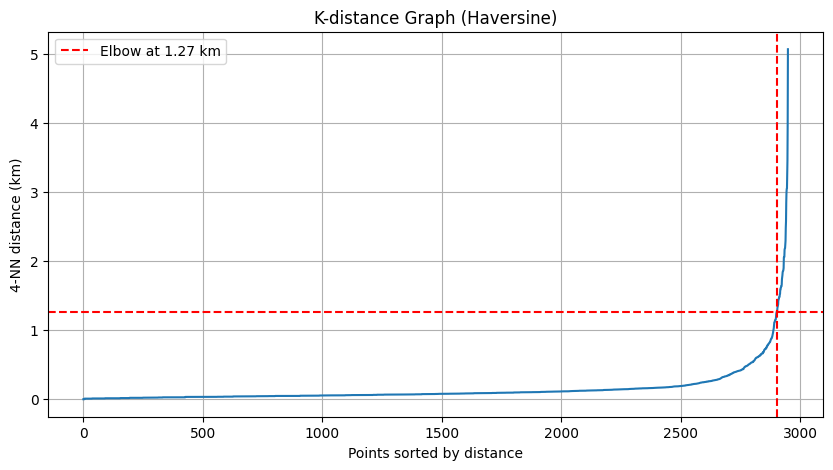

Suggested eps for DBSCAN (radians): 0.000199
Suggested eps for DBSCAN (km): 1.27


In [223]:

# Build BallTree with haversine distance
k = 4  # usually min_samples - 1
tree = BallTree(dbscan_radians_df, metric='haversine')

# Get distances to the k nearest neighbors
distances, indices = tree.query(dbscan_radians_df, k=k)
k_distances_rad = distances[:, k - 1]
k_distances_km = np.sort(k_distances_rad) * EARTH_RADIUS_KM  # convert to km

# Plot the k-distance graph
plt.figure(figsize=(10, 5))
plt.plot(k_distances_km)
plt.ylabel(f"{k}-NN distance (km)")
plt.xlabel("Points sorted by distance")
plt.title("K-distance Graph (Haversine)")
plt.grid(True)

# Optional: detect the elbow
kneedle = KneeLocator(range(len(k_distances_km)), k_distances_km, curve='convex', direction='increasing')
plt.axvline(kneedle.knee, color='red', linestyle='--', label=f"Elbow at {kneedle.knee_y:.2f} km")
plt.axhline(kneedle.knee_y, color='red', linestyle='--')
plt.legend()

plt.show()

# Suggested eps for DBSCAN (in radians!)
eps_radians = kneedle.knee_y / EARTH_RADIUS_KM
print(f"Suggested eps for DBSCAN (radians): {eps_radians:.6f}")
print(f"Suggested eps for DBSCAN (km): {kneedle.knee_y:.2f}")

Epsilon:  0.0001993407628315806
Found 5 clusters: [-1  0  1  2  3]
Clusterized rides: 98.47%


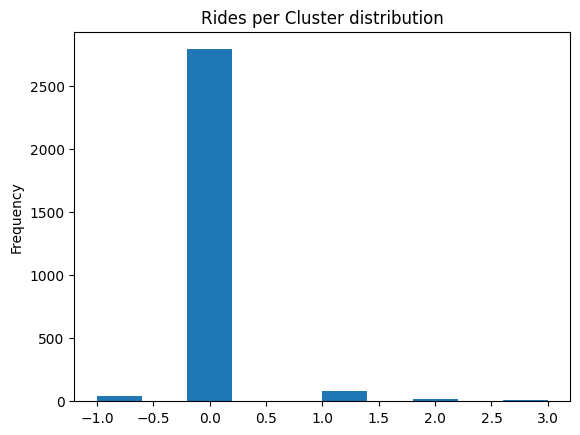

In [224]:
# radius km
EPS_KM = 1.27

# eps: distance threshold that determines the maximum distance between two points for them to be considered part of the same cluster.
epsilon = EPS_KM / EARTH_RADIUS_KM

# epsilon = 0.00036159
# 0.00015696101377226163
print("Epsilon: ", epsilon)

min_samples = 5

dbscan = DBSCAN(eps=epsilon, min_samples=min_samples, metric="haversine", algorithm="ball_tree")
dbscan.fit(dbscan_radians_df)
    
dbscan_cluster_df = dbscan_df.copy()
dbscan_cluster_df["dbscan_cluster"] = dbscan.labels_

clusters = np.unique(dbscan.labels_)
print(f"Found {len(clusters)} clusters: {clusters}")
ratio_clusterized = (dbscan_cluster_df["dbscan_cluster"] != -1).sum() * 100 / len(dbscan_cluster_df)
print(f"Clusterized rides: {ratio_clusterized:.2f}%")

fig = dbscan_cluster_df["dbscan_cluster"].plot.hist(title="Rides per Cluster distribution")
# fig.plot()


In [225]:
def dbscan_radians_gridsearch(eps, min_samples_candidates, x_radians):
    scores = []
    all_label = []

    for i, min_samples in enumerate(min_samples_candidates):
        dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric="haversine", algorithm="ball_tree")
        dbscan.fit(x_radians)
        labels = dbscan.labels_
        labels_set = set(labels)
        num_clusters = len(labels_set)
        if -1 in labels_set:
            num_clusters -= 1
        if (num_clusters < 2) or (num_clusters > 25):
            scores.append(-200)
            all_label.append("Poor")
            print("@ iteration :", i, "ep =", eps, "min_sample =", min_samples,
                  "number of cluster =", num_clusters, "moving on ...")
            continue
        scores.append(silhouette_score(x_radians, labels))
        all_label.append(labels)

        print("@ iteration :", i, "score :", scores[-1], "Number of clusters :", num_clusters)

    best_index = np.argmax(scores)
    best_parameters = (eps, min_samples_candidates[best_index])
    best_labels = all_label[best_index]
    best_score = scores[best_index]

    return {'best_eps': best_parameters[0],
            'best_min_samples': best_parameters[1],
            'best_labels': best_labels,
            'best_score': best_score}

def estimate_dbscan_parameters(eps_candidates, min_samples_candidates, x_radians, n_jobs=-1):
    
    eps_estimates = joblib.Parallel(n_jobs=-1, return_as="generator")(
        joblib.delayed(dbscan_radians_gridsearch)(eps, min_samples_candidates, x_radians) for eps in eps_candidates
    )

    # consume and combine
    estimates = [e for e in eps_estimates]

    df = pd.DataFrame(estimates)

    best_row_df = df[df["best_score"] == df["best_score"].max()]
    
    # return max best_score
    return best_row_df.iloc[0].to_dict()    


In [226]:
# de 100 m à 2 km
epsilon_candidates = np.linspace(0.1 / EARTH_RADIUS_KM, 2 / EARTH_RADIUS_KM, num=50)
min_samples_candidates = np.arange(2, 25, step=2)

print(min_samples_candidates)

best_dbscan_params = estimate_dbscan_parameters(epsilon_candidates, min_samples_candidates, dbscan_radians_df)

print(best_dbscan_params)

[ 2  4  6  8 10 12 14 16 18 20 22 24]
@ iteration : 0 ep = 3.395487845114502e-05 min_sample = 2 number of cluster = 86 moving on ...
@ iteration : 0 ep = 4.6127382046838515e-05 min_sample = 2 number of cluster = 71 moving on ...
@ iteration : 0 ep = 1.5696123057604773e-05 min_sample = 2 number of cluster = 254 moving on ...
@ iteration : 0 ep = 4.004113024899176e-05 min_sample = 2 number of cluster = 78 moving on ...
@ iteration : 0 ep = 2.178237485545152e-05 min_sample = 2 number of cluster = 162 moving on ...
@ iteration : 0 ep = 2.7868626653298268e-05 min_sample = 2 number of cluster = 116 moving on ...
@ iteration : 0 ep = 5.221363384468526e-05 min_sample = 2 number of cluster = 65 moving on ...
@ iteration : 0 ep = 9.48173964296125e-05 min_sample = 2 number of cluster = 34 moving on ...
@ iteration : 0 ep = 6.438613744037876e-05 min_sample = 2 number of cluster = 52 moving on ...
@ iteration : 0 ep = 7.655864103607225e-05 min_sample =@ iteration : 0 ep = 0.00010090364822745924 min

In [227]:
best_dbscan_params

{'best_eps': 0.00027740495036501496,
 'best_min_samples': 6,
 'best_labels': array([0, 0, 0, ..., 0, 0, 0]),
 'best_score': 0.6342919944540828}

Found 5 clusters: [-1  0  1  2  3]
Clusterized rides: 98.44%


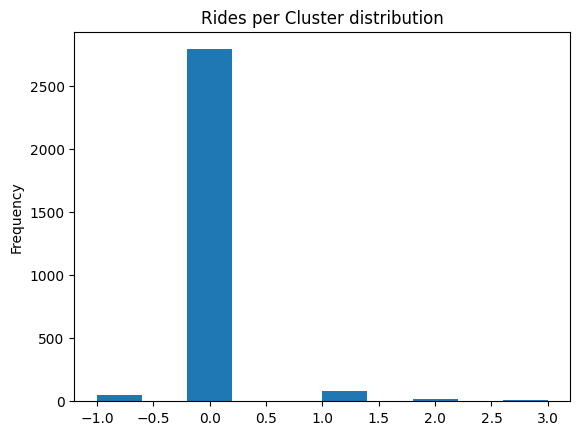

In [228]:
eps = best_dbscan_params["best_eps"]
min_samples = best_dbscan_params["best_min_samples"]

dbscan = DBSCAN(eps=epsilon, min_samples=min_samples, metric="haversine", algorithm="ball_tree")
dbscan.fit(dbscan_radians_df)
    
dbscan_cluster_df = dbscan_df.copy()
dbscan_cluster_df["dbscan_cluster"] = dbscan.labels_

clusters = np.unique(dbscan.labels_)
print(f"Found {len(clusters)} clusters: {clusters}")
ratio_clusterized = (dbscan_cluster_df["dbscan_cluster"] != -1).sum() * 100 / len(dbscan_cluster_df)
print(f"Clusterized rides: {ratio_clusterized:.2f}%")

fig = dbscan_cluster_df["dbscan_cluster"].plot.hist(title="Rides per Cluster distribution")

In [229]:
dbscan_cluster_df["dbscan_cluster"].value_counts()


dbscan_cluster
 0    2791
 1      85
-1      46
 2      19
 3       8
Name: count, dtype: int64

In [230]:
dbscan_centroids_df = dbscan_cluster_df[dbscan_cluster_df["dbscan_cluster"] != -1].groupby("dbscan_cluster")[["lat", "lon"]].mean().reset_index()
dbscan_centroids_df

,dbscan_cluster,lat,lon
0,0,40.743231,-73.981157
1,1,40.772116,-73.872647
2,2,40.836221,-73.937084
3,3,40.754188,-73.839750


In [231]:
plot_dbscan_cluster_df = dbscan_cluster_df[dbscan_cluster_df["dbscan_cluster"] != -1]

# Base map settings
mapbox_style = "open-street-map" #"carto-positron"
mapbox_center = {"lat": plot_dbscan_cluster_df["lat"].mean(), "lon": plot_dbscan_cluster_df["lon"].mean()}
    
# Les rides colorées par cluster    
fig_hour = px.scatter_map(
    plot_dbscan_cluster_df,
    lat="lat",
    lon="lon",
    opacity = 0.8,
    color="dbscan_cluster",
    # radius=5,
    center=mapbox_center,
    zoom=12,
    map_style=mapbox_style,
    title= f"DBSCAN clusters du {day}/{month:02d}/{assess_hour_and_cluster_df['dt_year'].unique()[0]} @ {hour}h"
)

fig_hour.add_trace(go.Scattermap(
    lat=dbscan_centroids_df["lat"],
    lon=dbscan_centroids_df["lon"],
    mode="markers+text",
    marker=dict(
        size=18,
        color="black",
        symbol="star"
    ),
    # name="",
    showlegend=False,
    text=[f"Centroid {i}" for i in dbscan_centroids_df.index],
    textposition="top right",
    subplot="map"
))

fig_hour.update_layout(
    margin=dict(l=10, r=10, t=50, b=10),
)

fig_hour.update_layout(height=1000, width=1000)

fig_hour.show()

<span style="color:orange">Snapshot `DBSCAN clusters du 4/09/2014 @ 18h` pour github:</span>

![dbscan_clusters.png](./assets/dbscan_clusters.png)

### Generalisation

Let try an all-in-one visualization!

Visualize hours of weekdays

In [232]:
# Let assign clusters on a daily basis!
# 1. copy dataframe and limit to 10000 rides per day (DBSCAN memory consumption is hudge!)
report_viz_df = raw_data_df.copy().groupby("dt_weekday").sample(100000).reset_index(drop=True)

# 2. convert lat/lon to radians
# Prepare dataset
# 1. select features
report_viz_df[["lat_rad", "lon_rad"]] = np.radians(report_viz_df[["lat", "lon"]])
report_viz_df

,date_time,lat,lon,base,dt_date,dt_year,dt_month,dt_week,dt_day,dt_day_name,dt_weekday,dt_hour,dt_minute,dt_second,lat_rad,lon_rad
0,2014-08-04 04:50:00,40.7211,-74.0094,B02617,2014-08-04,2014,8,32,4,Monday,0,4,50,0,0.710717,-1.291708
1,2014-07-21 16:24:00,40.7494,-74.0065,B02617,2014-07-21,2014,7,30,21,Monday,0,16,24,0,0.711211,-1.291657
2,2014-09-08 07:53:00,40.7844,-73.9792,B02598,2014-09-08,2014,9,37,8,Monday,0,7,53,0,0.711822,-1.291181
3,2014-06-09 14:40:00,40.7654,-73.9699,B02682,2014-06-09,2014,6,24,9,Monday,0,14,40,0,0.711490,-1.291018
4,2014-07-21 07:51:00,40.7070,-74.0153,B02512,2014-07-21,2014,7,30,21,Monday,0,7,51,0,0.710471,-1.291811
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
699995,2014-09-14 00:04:00,40.7321,-73.9914,B02617,2014-09-14,2014,9,37,14,Sunday,6,0,4,0,0.710909,-1.291394
699996,2014-09-07 20:40:00,40.8511,-73.9287,B02598,2014-09-07,2014,9,36,7,Sunday,6,20,40,0,0.712986,-1.290299
699997,2014-06-08 16:06:00,40.7479,-73.9766,B02598,2014-06-08,2014,6,23,8,Sunday,6,16,6,0,0.711185,-1.291135
699998,2014-07-27 16:47:00,40.7738,-73.9494,B02617,2014-07-27,2014,7,30,27,Sunday,6,16,47,0,0.711637,-1.290661


In [233]:
# prepare DBSCAN
# radius km
EPS_KM = 1.27

# eps: distance threshold that determines the maximum distance between two points for them to be considered part of the same cluster.
epsilon = EPS_KM / EARTH_RADIUS_KM

min_samples = 5

dbscan = DBSCAN(eps=epsilon, min_samples=min_samples, metric="haversine", algorithm="ball_tree")

In [234]:
report_viz_df["dbscan_cluster"] = -1

day_mapping = report_viz_df.drop_duplicates(subset=["dt_weekday", "dt_day_name"]) \
                .sort_values("dt_weekday") \
                .set_index("dt_weekday")["dt_day_name"] \
                .to_dict()

# Loop over weekdays
for weekday in report_viz_df["dt_weekday"].unique():
    # Loop over hours of day
    for hour in range(0, 24):
        print(f"Weekday {weekday} ({day_mapping[weekday]}) @ {hour:2d}h:")
        dbscan_subset_df = report_viz_df[(report_viz_df["dt_weekday"] == weekday) & (report_viz_df["dt_hour"] == hour)][["lat_rad", "lon_rad"]]
        print("shape: ", dbscan_subset_df.shape)

        dbscan.fit(dbscan_subset_df)

        dbscan_subset_df["dbscan_cluster"] = dbscan.labels_

        report_viz_df.loc[dbscan_subset_df.index, "dbscan_cluster"] = dbscan_subset_df["dbscan_cluster"]

        print(f"Found {dbscan_subset_df['dbscan_cluster'].unique()} clusters on {day_mapping[weekday]}")

Weekday 0 (Monday) @  0h:
shape:  (1139, 2)
Found [ 0  1 -1  2] clusters on Monday
Weekday 0 (Monday) @  1h:
shape:  (732, 2)
Found [ 0 -1  3  1  2] clusters on Monday
Weekday 0 (Monday) @  2h:
shape:  (522, 2)
Found [ 0 -1  1  2] clusters on Monday
Weekday 0 (Monday) @  3h:
shape:  (1211, 2)
Found [-1  0  1  2  3  4] clusters on Monday
Weekday 0 (Monday) @  4h:
shape:  (1689, 2)
Found [ 0  1  2 -1  3  4] clusters on Monday
Weekday 0 (Monday) @  5h:
shape:  (2532, 2)
Found [ 0  1 -1  2] clusters on Monday
Weekday 0 (Monday) @  6h:
shape:  (4374, 2)
Found [ 0 -1  1  2  4  3] clusters on Monday
Weekday 0 (Monday) @  7h:
shape:  (5869, 2)
Found [ 0  1 -1  2  3  4] clusters on Monday
Weekday 0 (Monday) @  8h:
shape:  (5617, 2)
Found [ 0 -1  4  1  2  3] clusters on Monday
Weekday 0 (Monday) @  9h:
shape:  (4210, 2)
Found [ 0 -1  1  2  4  3] clusters on Monday
Weekday 0 (Monday) @ 10h:
shape:  (3713, 2)
Found [ 0  2  1 -1] clusters on Monday
Weekday 0 (Monday) @ 11h:
shape:  (3854, 2)
Found 

In [244]:
weekday = 3 # Thursday

day_df = report_viz_df[report_viz_df["dt_weekday"] == weekday]
day_clusters_centroids_df = day_df[day_df["dbscan_cluster"] != -1].groupby(["dt_hour", "dbscan_cluster"])[["lat", "lon"]].mean().reset_index()

# Nombre de courses par heure
hourly_counts = day_df['dt_hour'].value_counts().sort_index()
line_chart = go.Scatter(
    x=hourly_counts.index,
    y=hourly_counts.values,
    mode='lines+markers',
    name='Nombre de courses',
    line=dict(color='blue')
)

# Base map settings
mapbox_style = "open-street-map" #"carto-positron"
mapbox_center = {"lat": day_df["lat"].mean(), "lon": day_df["lon"].mean()}

# Créer les frames pour chaque heure
frames = []
fig_0 = None
for hour in sorted(day_df["dt_hour"].unique()):
    hourly_df = day_df[day_df["dt_hour"] == hour]
    hourly_centroids_df = day_clusters_centroids_df[day_clusters_centroids_df["dt_hour"] == hour]
    fig_hour = px.density_map(
        hourly_df,
        lat="lat",
        lon="lon",
        z=None,
        radius=5,
        center=mapbox_center,
        zoom=11,
        map_style=mapbox_style,
    )
    
    fig_hour.add_trace(go.Scattermap(
        lat=hourly_centroids_df["lat"],
        lon=hourly_centroids_df["lon"],
        mode="markers+text",
        marker=dict(
            size=18,
            color="black",
            symbol="star"
        ),
        # name="",
        showlegend=False,
        text=[f"Centroid {i}" for i in hourly_centroids_df.index],
        textposition="top right",
        subplot="map"
    ))

    if not fig_0:
        fig_0 = fig_hour
    # fig_hour.update_layout(
    #     margin=dict(l=10, r=10, t=50, b=10),
    # )

    # fig_hour.update_layout(height=1000, width=1000)
    # Ligne verticale animée (sous forme de "shape")
    shape = {
        "type": "line",
        "xref": "x",
        "yref": "y",
        "x0": hour,
        "x1": hour,
        "y0": 0,
        "y1": hourly_counts.max(),
        "line": {"color": "red", "width": 2, "dash": "dash"}
    }

    frames.append(go.Frame(
        data=fig_hour.data,
        name=str(hour),
        layout={"shapes": [shape]}
    ))

# Figure principale
fig = go.Figure(
    data=fig_0.data,
    layout=go.Layout(
        title=f"Densité des courses par heure le {day}/{month:02d}/{df['dt_year'].unique()[0]}",
        map=dict(
            style=mapbox_style,
            center=mapbox_center,
            zoom=11
        ),
        updatemenus=[{
            "buttons": [
                {
                    "args": [None, {"frame": {"duration": 1000, "redraw": True}, "fromcurrent": True}],
                    "label": "Play",
                    "method": "animate"
                },
                {
                    "args": [[None], {"frame": {"duration": 0}, "mode": "immediate", "transition": {"duration": 0}}],
                    "label": "Pause",
                    "method": "animate"
                }
            ],
            "direction": "left",
            "pad": {"r": 10, "t": 87},
            "showactive": False,
            "type": "buttons",
            "x": 0.1,
            "xanchor": "right",
            "y": 0,
            "yanchor": "top"
        }],
        sliders=[{
            "active": 0,
            "pad": {"t": 50},
            "steps": [{
                "args": [[str(hour)], {"frame": {"duration": 1000, "redraw": True},
                                       "mode": "immediate"}],
                "label": f"{hour}h",
                "method": "animate"
            } for hour in sorted(df['dt_hour'].unique())]
        }]
    ),
    frames=frames
)

# Ajouter la courbe en dessous dans un subplot
final_fig = make_subplots(
    rows=2, cols=1,
    shared_xaxes=False,
    row_heights=[0.8, 0.2],
    vertical_spacing=0.05,
    specs=[[{"type": "map"}], [{"type": "xy"}]]
)

# Ajouter la trace map (initiale)
for trace in fig.data:
    final_fig.add_trace(trace, row=1, col=1)

# Ajouter la courbe
final_fig.add_trace(line_chart, row=2, col=1)

fig.update_layout(
    shapes=[  # ligne initiale
        dict(
            type="line",
            x0=0,
            x1=0,
            y0=0,
            y1=hourly_counts.max(),
            line=dict(color="red", width=2, dash="dash"),
            xref="x",
            yref="y"
        )
    ]
)

# Appliquer le reste des propriétés
final_fig.update_layout(fig.layout)
final_fig.frames = fig.frames

final_fig.update_layout(height=1000, width=1000)

final_fig.show()


<span style="color:orange">Snapshot `Hourly rides le 4/09/2014 @ 18h` pour github:</span>

![hourly_ride_density-01.png](./assets/hourly_ride_density-01.png)

In [236]:
def make_weekday_animation(weekday, report_viz_df):
    day_df = report_viz_df[report_viz_df["dt_weekday"] == weekday]
    day_clusters_centroids_df = day_df[day_df["dbscan_cluster"] != -1] \
        .groupby(["dt_hour", "dbscan_cluster"])[["lat", "lon"]].mean().reset_index()

    # Nombre de courses par heure
    hourly_counts = day_df['dt_hour'].value_counts().sort_index()

    # Base map settings
    mapbox_style = "open-street-map" #"carto-positron"
    
    # mapbox_center = {"lat": report_viz_df["lat"].mean(), "lon": report_viz_df["lon"].mean()}
    mapbox_center = {"lat": 40.742, "lon": -73.94 }

    # Créer les frames pour chaque heure
    frames = []
    
    fig_0 = None
    
    for hour in sorted(day_df["dt_hour"].unique()):
        hourly_df = day_df[day_df["dt_hour"] == hour]
        hourly_centroids_df = day_clusters_centroids_df[day_clusters_centroids_df["dt_hour"] == hour]
        fig_hour = px.density_map(
            hourly_df,
            lat="lat",
            lon="lon",
            z=None,
            radius=5,
            center=mapbox_center,
            zoom=11,
            map_style=mapbox_style,
        )
        
        fig_hour.add_trace(go.Scattermap(
            lat=hourly_centroids_df["lat"],
            lon=hourly_centroids_df["lon"],
            mode="markers+text",
            marker=dict(
                size=18,
                color="black",
                symbol="star"
            ),
            # name="",
            showlegend=False,
            text=[f"Centroid {i}" for i in hourly_centroids_df.index],
            textposition="top right",
            subplot="map"
        ))
        
        if not fig_0:
            fig_0 = fig_hour

        frames.append(go.Frame(
            data=fig_hour.data,
            name=str(hour),
        ))

    # Figure principale
    fig = go.Figure(
        data=fig_0.data,
        layout=go.Layout(
            title=f"Densité des courses par heure le {day_mapping[weekday]}",
            map=dict(
                style=mapbox_style,
                center=mapbox_center,
                zoom=11
            ),
            updatemenus=[{
                "buttons": [
                    {
                        "args": [None, {"frame": {"duration": 1000, "redraw": True}, "fromcurrent": True}],
                        "label": "Play",
                        "method": "animate"
                    },
                    {
                        "args": [[None], {"frame": {"duration": 0}, "mode": "immediate", "transition": {"duration": 0}}],
                        "label": "Pause",
                        "method": "animate"
                    }
                ],
                "direction": "left",
                "pad": {"r": 10, "t": 87},
                "showactive": False,
                "type": "buttons",
                "x": 0.1,
                "xanchor": "right",
                "y": 0,
                "yanchor": "top"
            }],
            sliders=[{
                "active": 0,
                "pad": {"t": 0},
                "steps": [{
                    "args": [[str(hour)], {"frame": {"duration": 1000, "redraw": True},
                                        "mode": "immediate"}],
                    "label": f"{hour}h",
                    "method": "animate"
                } for hour in sorted(df['dt_hour'].unique())]
            }]
        ),
        frames=frames
    )

    # Ajouter la courbe en dessous dans un subplot
    final_fig = make_subplots(
        rows=1, cols=1,
        shared_xaxes=False,
        # row_heights=[0.8, 0.2],
        vertical_spacing=0.05,
        specs=[[{"type": "map"}]] # , [{"type": "xy"}]
    )

    # Ajouter la trace map (initiale)
    for trace in fig.data:
        final_fig.add_trace(trace, row=1, col=1)

    # Appliquer le reste des propriétés
    final_fig.update_layout(fig.layout)
    final_fig.frames = fig.frames

    final_fig.update_layout(height=1000, width=1000)

    # final_fig.show()
    return final_fig

In [242]:
weekday_figs = {w: make_weekday_animation(w, report_viz_df) for w in range(7)}

for i in weekday_figs:
    fig = weekday_figs[i]
    fig.show()

<span style="color:orange">Snapshot `Sunday rides @ 20h` pour github:</span>

<img src="./assets/sunday_hourly_rides-01.png" />
